<a href="https://colab.research.google.com/github/L02mera/CompPhysLM/blob/main/Leonardo_Mera_Lecture_animation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Review of Projectile Motion



# Animations

*Adapted from M. Bellis*

Running animations in Jupyter notebooks can be a bit confusing...at first!

However, I hope that once you get it down, you'll really enjoy making movies of your work!


In [ ]:
# Import our other usual libraries
import numpy as np
import matplotlib.pylab as plt

# Plot a single point

Let's make sure we know how to draw a single point!

* using plt.plot, plot a point at $x=10$ and $y=15$
* use a red circle to mark the point
* set the $markersize=20$

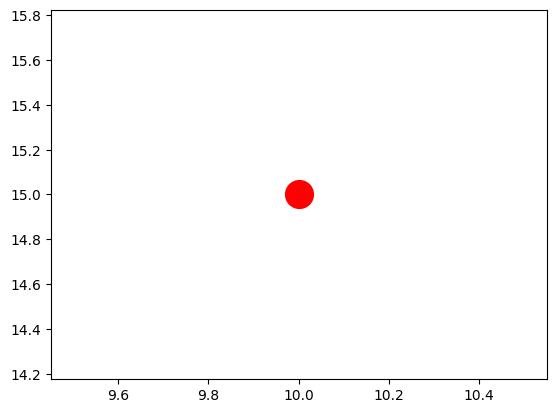

In [ ]:
# Your code here
x=10
y=15
plt.figure()
plt.plot(x,y,'ro',markersize=20)


# Animate a ball dropping off a roof

Animate a ball dropping off a roof in two different ways.

* Plot y (height) versus time
* Plot y (height) versus x-position

Write (or copy from previous work) some functions to do the calculations.

Make the initial height 100 meters and the initial velocity 0 meters/second.

Use 10 time steps at first and then slowly increase that number 10 at a time.


It takes 4.5175395145262565 seconds to fall


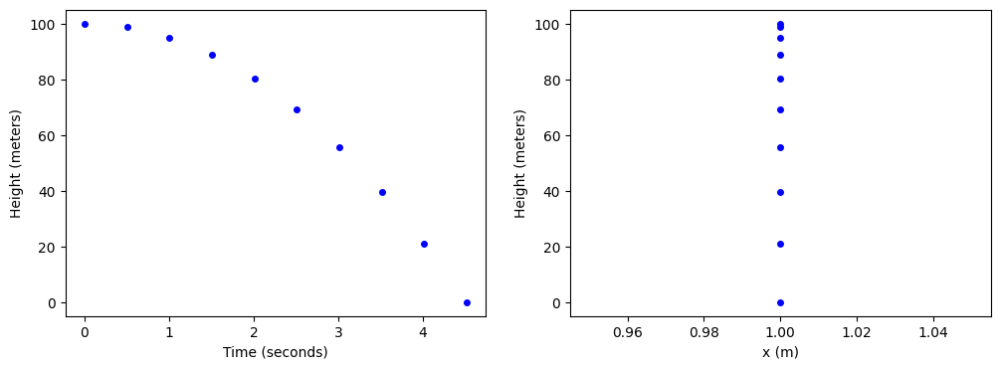

In [ ]:
# Your code and animation here

# write a function to take in x0, v0, a, and t
# and return position
def position(x0,v0,a,t):
    """calculate position given intitial conditions, accel, and time"""
    xf = x0 + v0 * t + .5 * a * t**2
    return xf

# write a function to calculate the time to fall
# from y0 to y
# the function should take y, y0, v0, and a
# this will require the quadratic eqn -
# be sure to return the positive root!
def time_to_fall(y,y0,v0,a):
    """ function to calculate time to reach y """
    a1 = a/2
    b = v0
    c = y0-y

    timeP = (-b+np.sqrt((b**2)-4*a1*c))/(2*a1)
    timeM = (-b-np.sqrt((b**2)-4*a1*c))/(2*a1)

    if timeP > 0:
      return timeP
    else:
      return timeM

# initial conditions of the ball
y0 = 100 # meters
yf = 0   # meters
v0y = 0   # m/s
ay = -9.8 # m/s^2

tf = time_to_fall(yf,y0,v0y,ay)
print("It takes {0} seconds to fall".format(tf))

# create an array of time_steps that ranges from
# zero to tf
# use 10 steps to start with
time_steps = np.linspace(0,tf,10)

# get the y position that corresponds to each time step
yposition = position(y0,v0y,ay,time_steps)

# the x position is constant, and we can set it equal to one
xposition = 1*np.ones(len(yposition))


fig = plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
# plot the y position vs. time
# using blue circles, and set the marker size to 4
plt.plot(time_steps,yposition,'bo',markersize=4)

plt.xlabel('Time (seconds)')
plt.ylabel('Height (meters)')

plt.subplot(1,2,2)
# plot the y position vs. x position
# using blue circles, and set the marker size to 4
plt.plot(xposition,yposition,'bo',markersize=4)

plt.xlabel('x (m)')
plt.ylabel('Height (meters)');


# Matplotlib built-in animation

* There are some relatively [standard tools](https://towardsdatascience.com/animations-with-matplotlib-d96375c5442c
 ) to make animations with Jupyter notebooks and Colab.
* More info [here](https://matplotlib.org/api/_as_gen/matplotlib.animation.FuncAnimation.html
 )
* The way these tools work is it asks you to draw each "*frame*" of a movie and then assembles those frames together into an animation. Like a [hand-drawn flipbook](https://en.wikipedia.org/wiki/Flip_book)!
* You want to think about how to calculate where your object is at every point in time.



In [ ]:
from matplotlib.animation import FuncAnimation
from matplotlib import rc


Let's move a point across the plot. It'll just move at a steady pace from the lower left corner to the upper right corner.

In [ ]:
# This can take a while, depending on how many frames you are generating
#  so be patient!

fig = plt.figure()

# The first difference is we define the size of the plot *first*
# Let's make a helper variable

# npts is really going to be used as the range of the plot.
npts = 100
ax = plt.axes(xlim=(0,npts), ylim=(0,npts))

# We also need to create an empty point that we'll draw into each frame
# This looks weird but it's just a regular plot...with no data in it!

point, = ax.plot( [], [], 'ro', markersize=20)


# We need an initialization function that empties the point at the start
# of the animation
#
# These initialization routines are fairly common in other programs and
# routines.
#
# Note that all this is doing is emptying out the data!

def init():
  point.set_data([], [])
  return point, # Note the comma at the end here!!!!!

# Now we need an animate funciton that takes in a number and sets the values
#
# The animate function will take in a counter that will go from 0 up to
# the value of the 'frames' argument.
#
# So in this example, we're just setting the x- and y-values both to 0,
# then 1, then 2, and so on.

def animate(i):
  x = i
  y = i
  point.set_data(x,y)
  return point,

# Note that the number of frames is the number of points here, though it doesn't have to be
# interval is the time in milliseconds between frames
# blit is whether or not to *only* draw the new stuff, see what happens when it's False
#

anim = FuncAnimation(fig, animate, init_func=init,
                               frames=npts, interval=20, blit=True)

# We need this so it doesn't draw an extra figure
plt.close()




In [ ]:
# Now do the animation
rc('animation', html='jshtml')
anim

<ipython-input-5-64cd5de2e7f7>:42: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  point.set_data(x,y)


### Modifying the code

Go back and change the number of points and interval to see how it reacts.

* What if the interval is 200 and npts is 10?
* What if the interval is 200 and npts is 100?
* What if the interval is 20 and npts is 100?



# Animating a sine curve

* Below you see the code from an example online.
* Step through the code and add comments to explain what each block does.  Does it all make sense to you?
* Can you predict what the above code will do before you see the plot?



In [ ]:
# This can take a while, depending on how many frames you are generating
#  so be patient!

fig = plt.figure()
ax = plt.axes(xlim=(0, 4), ylim=(-2, 2)) # setting limits
line, = ax.plot([], [], lw=3)

def init():
    line.set_data([], [])
    return line,

def animate(i): #animating function
    x = np.linspace(0, 4, 1000)# setting to the animation for the x axis
    y = np.sin(2 * np.pi * (x - 0.01 * i)) # sin part of the function to animate
    line.set_data(x, y)
    return line,

anim = FuncAnimation(fig, animate, init_func=init, #frames and intevals using animation functions
                               frames=200, interval=20, blit=True)

# We need this so it doesn't draw an extra figure
plt.close()



### Now run the animation

* the cell below will run the animation.
* How do you make your plot slower? How do you make it faster? Smoother? Does it take long to "render"? That is, does it take long to generate the animation?

In [ ]:
# Now do the animation
rc('animation', html='jshtml')
anim

# Animate the Ball Falling

* Using the animation examples above AND the code, we can animate the position of a ball to animate the ball.
* Specifically, we will animate the y position.
* In the cell below, use a formatted print statement to print the time of flight to 3 decimal places.


In [ ]:
# We'll use the same starting conditions

y0 = 100 # meters
yf = 0   # meters
v0 = 0   # m/s
a = -9.8 # m/s^2

tf = time_to_fall(yf,y0,v0,a)
print("It takes {0} seconds to fall".format(tf))

# This can take a while, depending on how many frames you are generating
#  so be patient!

fig = plt.figure()

# The first difference is we define the size of the plot *first*
# Let's make a helper variable

dt = 0.1 # This will be the size of our timesteps
npts = int(tf/dt)
print("Our animation will have {0} timesteps".format(npts))

# Let's set the range of our axes as if it was just dropping down
# Does the following make sense?
ax = plt.axes(xlim=(0, 2), ylim=(yf, y0))

# We also need to create an empty point that we'll draw into each frame
# This looks weird but it's just a regular plot...with no data in it!
point, = ax.plot([], [], 'ro', markersize=20)

# We need an initialization function that empties the point at the start
# of the animation
#
# These initialization routines are fairly common in other programs and
# routines.
#
# Note that all this is doing is emptying out the data!
def init():
    point.set_data([], [])
    return point,

# Now we need an animate function that takes in a number and sets the values
def animate(i):
    t = i*dt
    x = 1
    y = position(y0,v0,a,t)
    point.set_data(x, y)
    return point,

# Note that the number of frames is the number of points here, though it doesn't have to be
# interval is the time in milliseconds between frames
# blit is whether or not to *only* draw the new stuff, see what happens when it's False
anim = FuncAnimation(fig, animate, init_func=init,
                               frames=npts, interval=20, blit=True)

# We need this so it doesn't draw an extra figure
plt.close()

It takes 4.5175395145262565 seconds to fall
Our animation will have 45 timesteps


In [ ]:
## Now do the animation
rc('animation', html='jshtml')
anim

# Check out when you "Reflect"

<ipython-input-9-ff869485898f>:47: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  point.set_data(x, y)


# Animate a ball being thrown off a cliff

* Animate a ball that is thrown at an angle of 30 degrees above the horizontal from a cliff that is 50 meters high.
* Let the initial velocity be 10~m/s.
* Write a list of comments to describe what your code needs to do.  Make sure you write (or copy from previous work) some functions to do the calculations.
* You don't have to, but can you think of a way to streamline some of the calculations using `numpy`?

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Initial conditions of the ball
y0 = 100  # meters (cliff height)
yf = 0    # meters (final height)
v0y = 0   # m/s (initial vertical velocity)
ay = -9.8  # m/s^2 (acceleration due to gravity)

# Calculate time to fall
tf = time_to_fall(yf, y0, v0y, ay)
print("It takes {0} seconds to fall".format(tf))

# Create an array of time steps that ranges from
# zero to tf
# Use 100 steps for smoother animation
time_steps = np.linspace(0, tf, 100)

# Set up Matplotlib for inline plotting in Colab
%matplotlib inline

# Set up the animation
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

axs[0].set_xlim(0, tf)
axs[0].set_ylim(yf, y0)
axs[0].set_xlabel('Time (seconds)')
axs[0].set_ylabel('Height (meters)')


point, = axs[0].plot([], [], 'bo', markersize=4)
line, = axs[1].plot([], [], 'bo', markersize=4)

def init():
    point.set_data([], [])
    line.set_data([], [])
    return point, line

def animate(i):
    t = time_steps[i]
    y = position(y0, v0y, ay, t)
    point.set_data(t, y)
    line.set_data(1, y)
    return point, line

# Create the animation
anim = FuncAnimation(fig, animate, init_func=init,
                     frames=len(time_steps), interval=20, blit=True)
plt.close()



It takes 4.5175395145262565 seconds to fall


In [ ]:
anim